## Lab 2

## Bifurcation map

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import Image
import os
import pickle

In [2]:
def logistic_map_step(x, r):
    return r * x * (1 - x)

def bifurcation_map(r, m: int=1, n: int=1):
    '''
    m - number of last values
    n - number of first values
    '''
    Y = np.zeros((len(r), m))
    for i in range(len(r)):
        Y[i, 0] = np.random.random()
        for j in range(m+n-1):
            if j >= n:
                Y[i, j-n+1] = logistic_map_step(Y[i, j-n], r[i])
            else:
                Y[i, 0] = logistic_map_step(Y[i, 0], r[i])
    
    return Y

In [ ]:
r_params = np.linspace(1, 4, 10001)
Y = bifurcation_map(
    r=r_params,
    m=200,
    n=200,
)

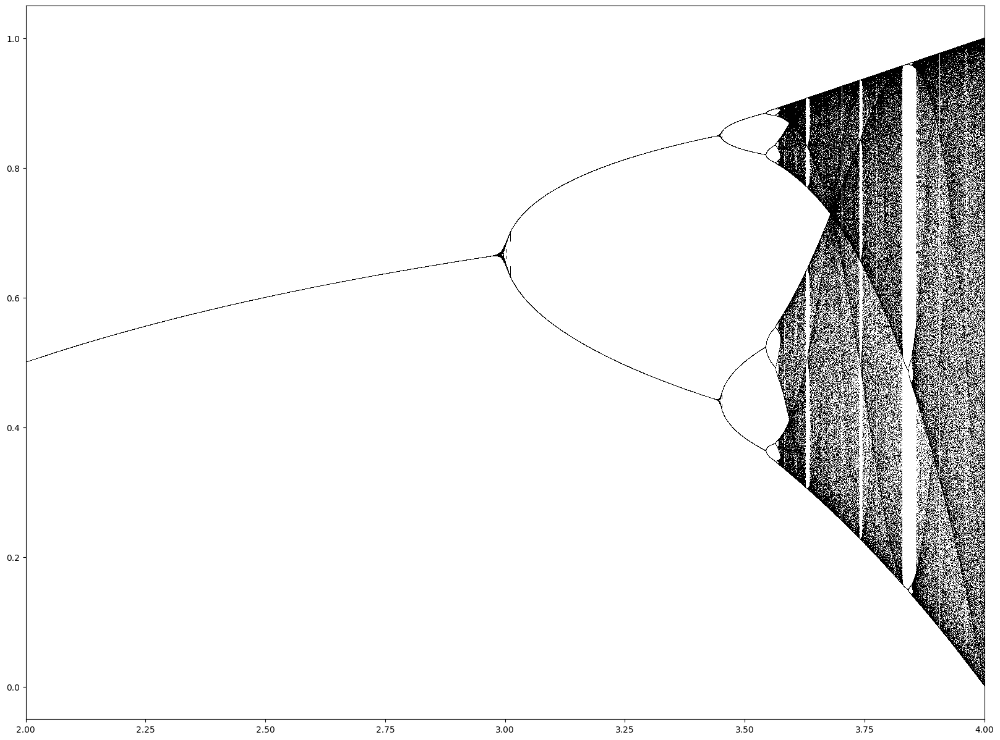

In [54]:
fig = plt.figure(figsize=[20, 15], )
for i, r in enumerate(r_params):
    plt.plot(np.ones(Y.shape[1])*r_params[i], Y[i], ls='', marker=',', color='black')

plt.xlim([2, 4])
plt.show()

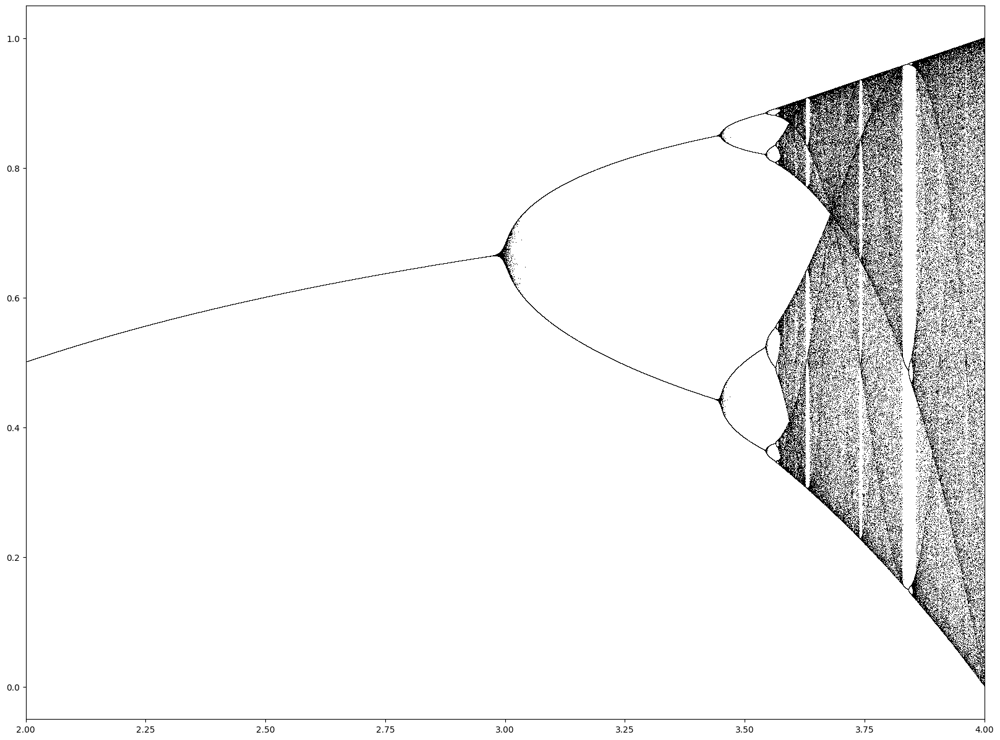

In [58]:
r_params = np.linspace(1, 4, 1000001)
Y = bifurcation_map(
    r=r_params,
    m=1,
    n=200,
)
fig = plt.figure(figsize=[20, 15], )
plt.plot(r_params, Y, ls='', marker=',', color='black')
plt.xlim([2, 4])
plt.show()

Задание 2. Фрактал Жулиа
-------

Очень похожее отображение, только в комплексных числах.

$z_0 \in \mathbb{C}$

$C \in \mathbb{C}$

$z_{n+1} = z_n^2 + C$

Пошаговая инструкция:

1. Сделайте отображение, посмотрите на динамику $z$ для какого-то выбранного $C$.
2. Меняя значения $z_0$ посмотрите на различия в динамике.
3. Задайте двумерную матрицу отображающую числа $z_0$ c Re от -2, 2 и Im от -2, 2. Для каждой точки матрицы (она отвечает какому-то значению $z_0 = Re + Im$) делаем динамику 'max_iter' число раз. Если модуль числа $z$ на каком-то шаге становится больше 2 (можно менять), то возвращаем итерацию на которой это произошло. Если нет, то возвращаем 'max_iter'
4. Рисуем фрактал

Задания:

* Для $c=e^{ia}$, где `a = range(0, 2pi)` сделайте анимацию изменения фрактала:

https://stackoverflow.com/questions/753190/programmatically-generate-video-or-animated-gif-in-python


In [3]:
def juliaSet(len_points: int, xmin: int, xmax: int, ymin: int, ymax: int, maxiter: int, C: complex):
    x = np.linspace(xmin, xmax, len_points)
    y = np.linspace(ymin, ymax, len_points)
    output = np.zeros((len(y), len(x)))

    for i, xcoord in enumerate(x):
        for j, ycoord in enumerate(y):
            n = 0
            z = complex(xcoord, ycoord)
            while abs(z) <= 2.0 and n < maxiter:
                z = z**2 + C
                n += 1
            output[i, j] = n / maxiter
    return output
        

In [20]:
C1 = complex(0.4, 0.2)
output1 = juliaSet(
    len_points=1001,
    xmin=-2,
    xmax=2,
    ymin=-2,
    ymax=2,
    maxiter=70,
    C=C1
)

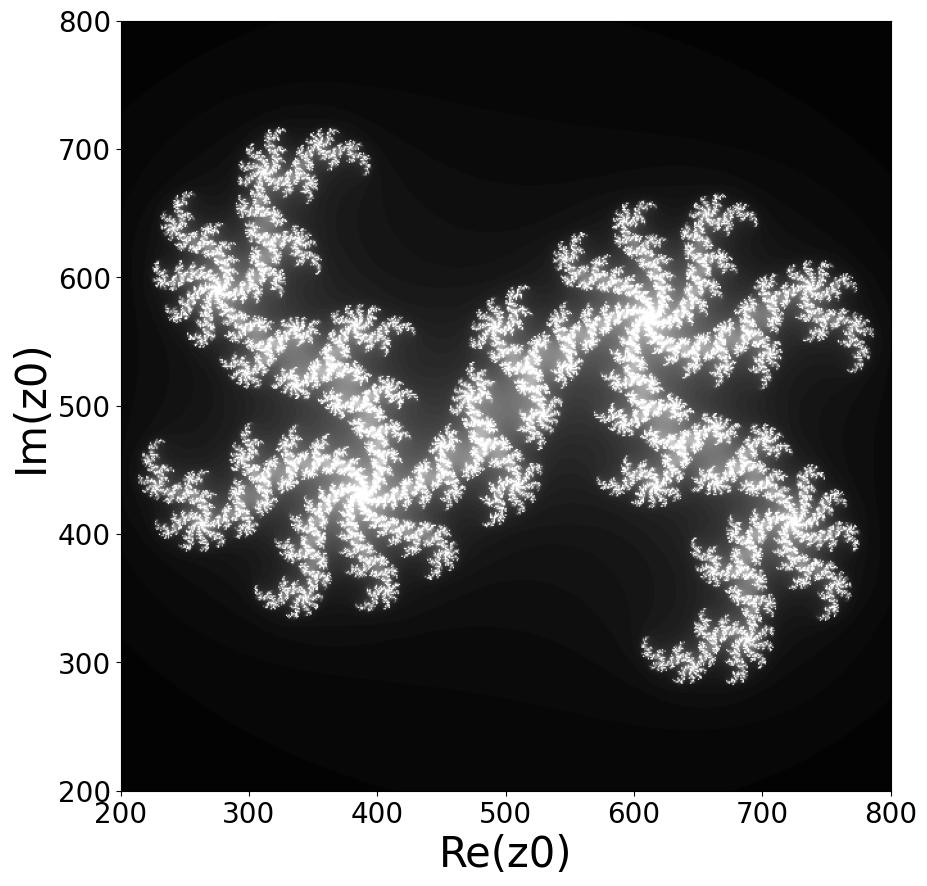

In [21]:
fig = plt.figure(figsize=[15, 10], )
plt.imshow(output1, cmap=plt.cm.gray)
plt.xlabel('Re(z0)', fontsize=30)
plt.xticks(fontsize=20)
plt.xlim([200, 800])
plt.ylabel('Im(z0)', fontsize=30)
plt.yticks(fontsize=20)
plt.ylim([200, 800])
plt.show()

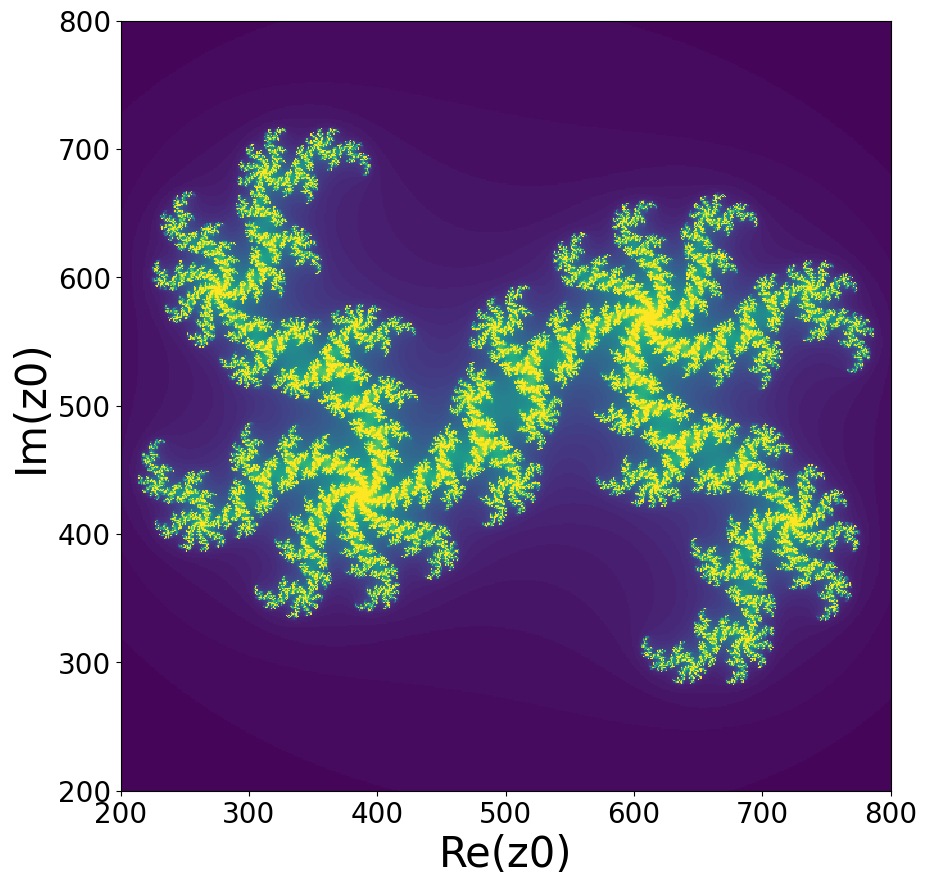

In [68]:
fig = plt.figure(figsize=[15, 10], )
plt.imshow(output1, interpolation='nearest')
plt.xlabel('Re(z0)', fontsize=30)
plt.xticks(fontsize=20)
plt.xlim([200, 800])
plt.ylabel('Im(z0)', fontsize=30)
plt.yticks(fontsize=20)
plt.ylim([200, 800])
plt.show()

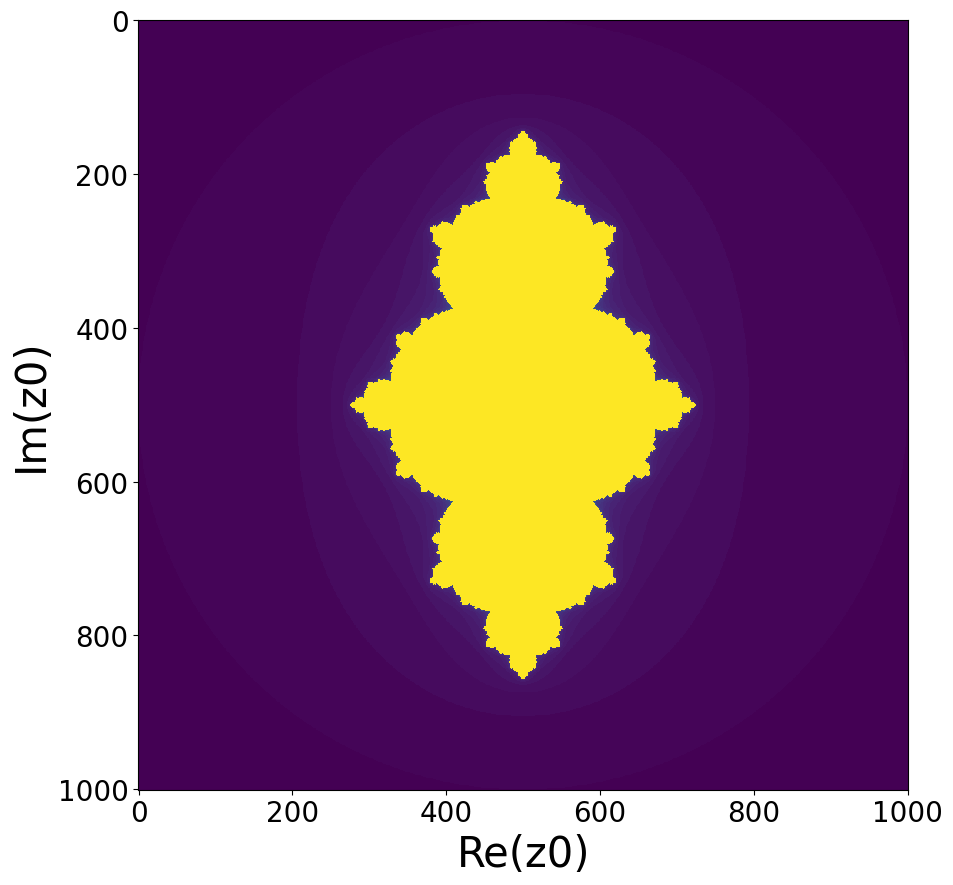

In [70]:
goldRatio = (1 + np.sqrt(5)) / 2
C2 = 1 - goldRatio
output2 = juliaSet(
    len_points=1001,
    xmin=-2,
    xmax=2,
    ymin=-2,
    ymax=2,
    maxiter=70,
    C=C2
)

fig = plt.figure(figsize=[15, 10], )
plt.imshow(output2, interpolation='nearest')
plt.xlabel('Re(z0)', fontsize=30)
plt.xticks(fontsize=20)
#plt.xlim([200, 800])
plt.ylabel('Im(z0)', fontsize=30)
plt.yticks(fontsize=20)
#plt.ylim([200, 800])
plt.show()

In [ ]:
C3 = [complex(np.cos(a), np.sin(a)) for a in np.linspace(0, 2*np.pi, 101)]
results = [
    juliaSet(
    len_points=1001,
    xmin=-2,
    xmax=2,
    ymin=-2,
    ymax=2,
    maxiter=70,
    C=c
    ) 
    for c in C3
]

with open('juliaSet_results.pkl', 'wb') as f:
    pickle.dump(results, f)
    f.close()

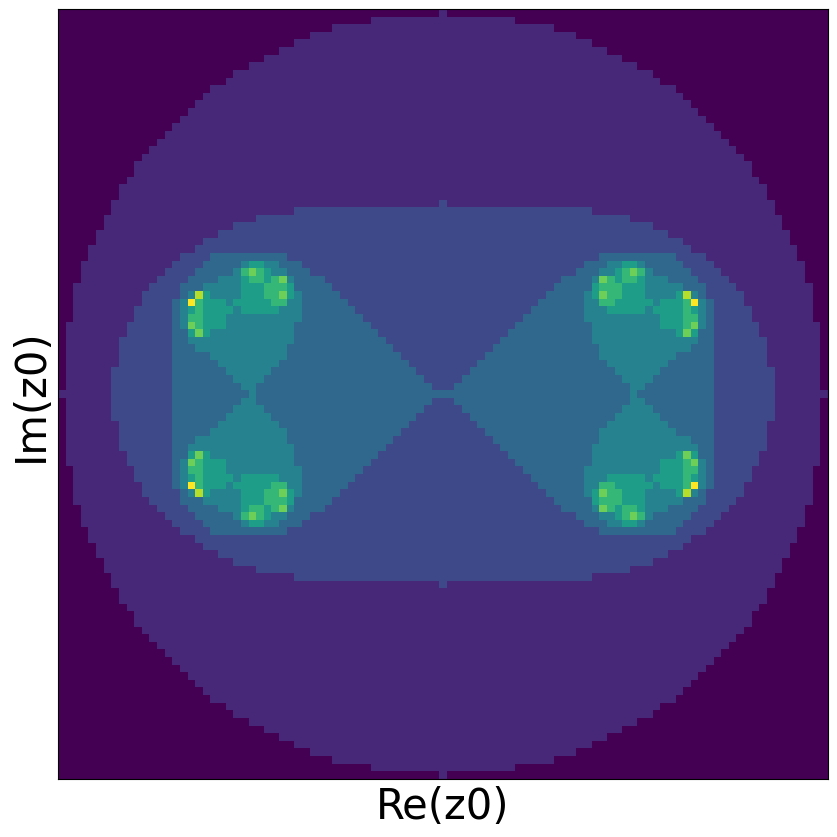

In [6]:
with open('juliaSet_results.pkl', 'rb') as f:
    results = pickle.load(f)
    f.close()

fig = plt.figure(figsize=[15, 10], )
ax = plt.axes()


def update_data(frame):
    ax.clear()
    ax.set_xlabel('Re(z0)', fontsize=30)
    ax.set_xticks([], [], fontsize=20)

    ax.set_ylabel('Im(z0)', fontsize=30)
    ax.set_yticks([], [], fontsize=20)
    return [ax.imshow(results[frame], interpolation='nearest')]

animation = FuncAnimation(
    fig=fig,
    func=update_data,
    frames=len(results),
    interval=30,
    blit=True
)

In [8]:
#from signal import signal, SIGPIPE, SIG_DFL
#signal(SIGPIPE,SIG_DFL) 
animation.save('juliaSet.gif', writer='imagemagick')

MovieWriter imagemagick unavailable; using Pillow instead.


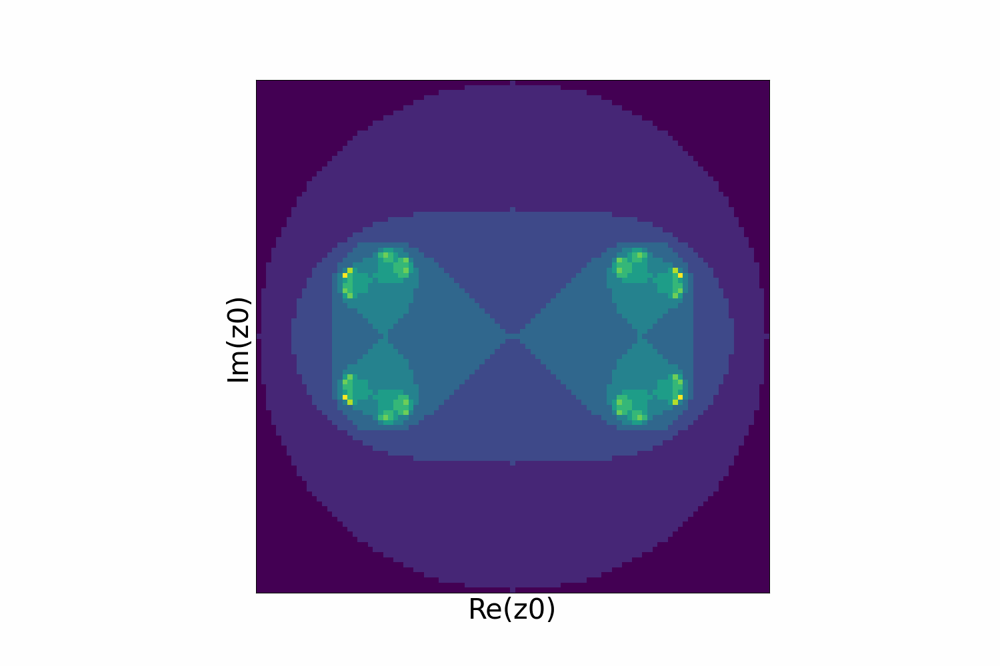

In [9]:
Image(open('juliaSet.gif','rb').read())